In [1]:
#import lightgbm
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit, KFold, TimeSeriesSplit
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series

import warnings
warnings.filterwarnings(action='ignore')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

In [2]:
#데이터 불러오기
train_df = pd.read_csv('./data/train.csv')
test_df = pd.read_csv('./data/test.csv')
building_info =  pd.read_csv('./data/building_info.csv')

train_df = train_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
test_df = test_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
building_info = building_info.rename(columns={
    '건물번호': 'building_number',
    '건물유형': 'building_type',
    '연면적(m2)': 'total_area',
    '냉방면적(m2)': 'cooling_area',
    '태양광용량(kW)': 'solar_power_capacity',
    'ESS저장용량(kWh)': 'ess_capacity',
    'PCS용량(kW)': 'pcs_capacity'
})
translation_dict = {
    '건물기타': 'Other Buildings',
    '공공': 'Public',
    '대학교': 'University',
    '데이터센터': 'Data Center',
    '백화점및아울렛': 'Department Store and Outlet',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '지식산업센터': 'Knowledge Industry Center',
    '할인마트': 'Discount Mart',
    '호텔및리조트': 'Hotel and Resort'
}

building_info['building_type'] = building_info['building_type'].replace(translation_dict)


train_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity,sunshine,solar_radiation,power_consumption
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [3]:
test_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


In [4]:
building_info.head()

,building_number,building_type,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity
0,1,Other Buildings,110634.00,39570.00,-,-,-
1,2,Other Buildings,122233.47,99000.00,-,-,-
2,3,Other Buildings,171243.00,113950.00,40,-,-
3,4,Other Buildings,74312.98,34419.62,60,-,-
4,5,Other Buildings,205884.00,150000.00,-,2557,1000


Train 과 Test의 차이: columns에 일조, 일사, 전력 소비량이 없다.

## 전처리 (병합, 빈칸 채우기, 형 변환, num_date_time 삭제)

In [3]:

pd.set_option('display.max_columns', 30)

def merge(df):
    df = df.fillna(0)
    date = pd.to_datetime(df.date_time)
    df['hour'] = date.dt.hour
    df['day'] = date.dt.weekday
    df['month'] = date.dt.month
    df['week'] = date.dt.weekofyear
    
    # 'building_number'를 기준으로 두 데이터프레임 병합 및 전처리
    merged_df = pd.merge(df, building_info, on='building_number',how='right')
    #merge후 전처리
    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].replace('-', 0)
    merged_df['ess_capacity'] = merged_df['ess_capacity'].replace('-', 0)
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].replace('-', 0)

    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].astype('float64')
    merged_df['ess_capacity'] = merged_df['ess_capacity'].astype('float64')
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].astype('float64')
    return merged_df.drop(columns =['num_date_time','building_type'])


merged_train_df_m = merge(train_df)
merged_test_df_m = merge(test_df)

kk = merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 16)&(merged_train_df_m.day == 2), 'power_consumption']
sum16 = kk.sum()/12
kkk = merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 17)&(merged_train_df_m.day == 2), 'power_consumption']
sum17 = (kkk.sum()-0.36)/12
merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 16)&(merged_train_df_m.day == 2)&(merged_train_df_m.month == 7)&(merged_train_df_m.week == 30)
                    , 'power_consumption'] = sum16
merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 17)&(merged_train_df_m.day == 2)&(merged_train_df_m.month == 7)&(merged_train_df_m.week == 30)
                    , 'power_consumption'] = sum17

# #######################################
# ## 건물별, 요일별, 시간별 발전량 평균 넣어주기
# #######################################
# power_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
# tqdm.pandas()
# #######################################
# ## 건물별 시간별 발전량 평균 넣어주기
# #######################################
# power_hour_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
# tqdm.pandas()
#     #######################################
# ## 건물별 시간별 발전량 표준편차 넣어주기
# #######################################
# power_hour_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
# tqdm.pandas()

In [4]:
def preprocessing(df):
    # df['day_hour_mean'] = df.progress_apply(lambda x : power_mean.loc[(power_mean.building_number == x['building_number']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power_consumption'].values[0], axis = 1)
    # df['hour_mean'] = df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_number == x['building_number']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)   
    # df['hour_std'] = df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_number == x['building_number']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)
    
    #######################################
    ## 건물별, 요일별, 전력시간별 소비량 평균 넣어주기
    #######################################
    power_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
    #######################################
    ## 건물별, 요일별, 전력시간별 소비량 표준편차 넣어주기
    #######################################
    power_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.std).reset_index()
    #######################################
    ## 건물별 시간별 전력소비량 평균 넣어주기
    #######################################
    power_hour_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
    #######################################
    ## 건물별 시간별 전력소비량 표준편차 넣어주기
    #######################################
    power_hour_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
    
    
    # 병합을 위한 키 설정
    merge_keys = ['building_number', 'hour', 'day']  
    # 데이터프레임 병합
    df = df.merge(power_mean[merge_keys + ['power_consumption']], on=merge_keys, how='left', suffixes=('', '_day_hour_mean'))
    df = df.merge(power_std[merge_keys + ['power_consumption']], on=merge_keys, how='left', suffixes=('', '_day_hour_std'))
    df = df.merge(power_hour_mean[merge_keys[:-1] + ['power_consumption']], on=merge_keys[:-1], how='left', suffixes=('', '_hour_mean'))
    df = df.merge(power_hour_std[merge_keys[:-1] + ['power_consumption']], on=merge_keys[:-1], how='left', suffixes=('', '_hour_std'))
    df = df.rename(columns = {'power_consumption_day_hour_mean':'day_hour_mean','power_consumption_day_hour_std':'day_hour_std','power_consumption_hour_mean':'hour_mean','power_consumption_hour_std':'hour_std',})
    

    def CDH(xs):
        ys = []
        for i in range(len(xs)):
            if i < 11:
                ys.append(np.sum(xs[:(i+1)]-26))
            else:
                ys.append(np.sum(xs[(i-11):(i+1)]-26))
        return np.array(ys)

    cdhs = np.array([])
    for num in range(1,101,1):
        temp = df[df['building_number'] == num]
        cdh = CDH(temp['temperature'].values)
        cdhs = np.concatenate([cdhs, cdh])
    df['CDH'] = cdhs
    
    ### 공휴일 변수 추가
    df['holiday'] = df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
    #df.loc[('2022-08-15'<=df.date_time)&('2022-06-01'<=df.date_time)&('2022-06-06'<=df.date_time), 'holiday'] = 1
    df['date_time'] = df['date_time'].apply(lambda x : int(x[0:8]))
    df.loc[(df.date_time == 20220601, 'holiday')] = 1
    df.loc[(df.date_time == 20220606, 'holiday')] = 1
    df.loc[(df.date_time == 20220815, 'holiday')] = 1

    ## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
    df['sin_time'] = np.sin(2*np.pi*df.hour/24)
    df['cos_time'] = np.cos(2*np.pi*df.hour/24)
    
    ## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
    df['THI'] = 9/5*df['temperature'] - 0.55*(1-df['humidity']/100)*(9/5*df['humidity']-26)+32

    
    return df

merged_train_df_m =preprocessing(merged_train_df_m)
merged_test_df_m =preprocessing(merged_test_df_m).rename(columns = {'power_consumption':'day_hour_mean'})


In [5]:
merged_train_df = pd.DataFrame()
merged_valid_df = pd.DataFrame()
for i in range(1,101,1):
    buff = merged_train_df_m.loc[(merged_train_df_m.building_number == i)]
    merged_train_df = pd.concat([merged_train_df, buff[:-168]])
    merged_valid_df = pd.concat([merged_valid_df, buff[-168:]])

In [6]:

def data_train(df):

    #df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #grouped = df.groupby(['building_number', 'week', 'day'])
    grouped = df.groupby(['building_number', 'date_time'])

    df['max_power'] = grouped['power_consumption'].transform(np.max)
    df['min_power'] = grouped['power_consumption'].transform(np.min)
    
    #grouped2 = df.groupby(['building_number', 'week', 'day','holiday'])
    grouped2 = df.groupby(['building_number', 'day'])

    df['max_power'] = grouped2['max_power'].transform(np.mean)
    df['min_power'] = grouped2['min_power'].transform(np.mean)

    #df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area','cooling_area'],inplace= True)
    df.drop(columns=['cooling_area', 'sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area'],inplace= True)

    return df

def data_test(df):

    #df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #df.drop(columns=['max_power', 'min_power'])
    grouped_train = merged_train_df.groupby(['building_number', 'day'])
    max_power = grouped_train['max_power'].median()
    min_power = grouped_train['min_power'].median()
    max_power_df = max_power.reset_index()
    min_power_df = min_power.reset_index()

    # 테스트 데이터에 max_power_median와 min_power_median을 추가
    df = pd.merge(df, max_power_df, on=['building_number', 'day'])
    df = pd.merge(df, min_power_df, on=['building_number', 'day'])

    #df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['pcs_capacity','ess_capacity','solar_power_capacity','total_area','cooling_area'],inplace= True)
    df.drop(columns=['cooling_area','pcs_capacity','ess_capacity','solar_power_capacity','total_area'],inplace= True)

    return df


merged_train_df =data_train(merged_train_df)
merged_valid_df =data_test(merged_valid_df)
merged_test_df =data_test(merged_test_df_m)
merged_valid_df = merged_valid_df.drop(columns = 'sunshine')
merged_valid_df = merged_valid_df.drop(columns = 'solar_radiation')


In [7]:
final_train_df = data_train(merged_train_df_m)

In [8]:
merged_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204000 entries, 0 to 203999
Data columns (total 24 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   building_number              204000 non-null  int64  
 1   date_time                    204000 non-null  int64  
 2   temperature                  204000 non-null  float64
 3   rainfall                     204000 non-null  float64
 4   windspeed                    204000 non-null  float64
 5   humidity                     204000 non-null  float64
 6   power_consumption            204000 non-null  float64
 7   hour                         204000 non-null  int64  
 8   day                          204000 non-null  int64  
 9   month                        204000 non-null  int64  
 10  week                         204000 non-null  int64  
 11  cooling_area                 204000 non-null  float64
 12  day_hour_mean                204000 non-null  float64
 13 

In [10]:
## save the preprocessed data
merged_train_df.drop(columns=['date_time']).to_csv('./data/train_preprocessed_holly3_lbw.csv')
merged_test_df.drop(columns=['date_time']).to_csv('./data/test_preprocessed_holly3_lbw.csv')
final_train_df.drop(columns=['date_time']).to_csv('./data/final_train_preprocessed_holly3_lbw.csv')
merged_valid_df.drop(columns=['date_time']).to_csv('./data/valid_preprocessed_holly3_lbw.csv')

## 추가 전처리

In [2]:
## save the preprocessed data
merged_train_df = pd.read_csv('./data/train_preprocessed_holly3_lbw.csv')
merged_test_df = pd.read_csv('./data/test_preprocessed_holly3_lbw.csv')
final_train_df = pd.read_csv('./data/final_train_preprocessed_holly3_lbw.csv')
merged_valid_df = pd.read_csv('./data/valid_preprocessed_holly3_lbw.csv')


In [3]:
merged_train_df = merged_train_df.drop(columns = 'Unnamed: 0')
merged_test_df = merged_test_df.drop(columns = 'Unnamed: 0')
final_train_df = final_train_df.drop(columns = 'Unnamed: 0')
merged_valid_df = merged_valid_df.drop(columns = 'Unnamed: 0')
# merged_train_df = merged_train_df.drop(columns = 'cooling_area')
# merged_test_df = merged_test_df.drop(columns = 'cooling_area')
# merged_train_df = merged_train_df.drop(columns = 'solar_to_ess_ratio')
# merged_test_df = merged_test_df.drop(columns = 'solar_to_ess_ratio')
# merged_train_df = merged_train_df.drop(columns = 'cooling_to_total_area_ratio')
# merged_test_df = merged_test_df.drop(columns = 'cooling_to_total_area_ratio')


## 원핫 인코딩(안해도 됨)

In [10]:
# merged_train_df = pd.get_dummies(merged_train_df, prefix=["bt:"], columns=["building_type"])
# merged_train_df.head()
# merged_test_df = pd.get_dummies(merged_test_df, prefix=["bt:"], columns=["building_type"])
# merged_test_df.head()

## 성능 평가지표 정의 및 SMAPE 정의

In [4]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

In [ ]:
# for i in np.arange(0.8, 1.0, 0.1):
#     print(i)
# for i in np.arange(1, 101, 1):
#     print(i)   

## 최적의 파라미터 탐색

In [23]:

df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 12, 1),
        'max_depth' : np.arange(3,10,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

#tscv = TimeSeriesSplit(n_splits=3)
smape_score = make_scorer(SMAPE, greater_is_better=False)

for i in tqdm(np.arange(1, 101, 1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    pds = PredefinedSplit(np.append(-np.ones(len(x_train)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed=0,tree_method="hist"),
                       param_grid=grid, scoring=smape_score, cv=pds, refit=True, verbose=True)
    
    # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1, tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
    #                     param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)

    gcv.fit(x_train, y_train)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_test)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index=[0])], axis=0)
    df.to_csv('./parameters/hyperparameter_xgb_holly2_lbw.csv', index=False) # save the tuned parameters


  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 308 candidates, totalling 308 fits


  1%|          | 1/100 [00:18<30:24, 18.43s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building1|| SMAPE : 44.73870004599009
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  2%|▏         | 2/100 [00:37<30:51, 18.89s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building2|| SMAPE : 40.85149257902284
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  3%|▎         | 3/100 [00:59<32:58, 20.40s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building3|| SMAPE : 35.80753242147779
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  4%|▍         | 4/100 [01:14<29:18, 18.32s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building4|| SMAPE : 42.42476630517394
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  5%|▌         | 5/100 [01:35<30:11, 19.07s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building5|| SMAPE : 47.087903219346074
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  6%|▌         | 6/100 [01:52<28:46, 18.37s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building6|| SMAPE : 46.977023904224154
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  7%|▋         | 7/100 [02:11<28:47, 18.57s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building7|| SMAPE : 41.347823161071645
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  8%|▊         | 8/100 [02:26<26:38, 17.37s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building8|| SMAPE : 45.08589372270002
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  9%|▉         | 9/100 [02:44<27:00, 17.81s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building9|| SMAPE : 44.94097062010776
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 10%|█         | 10/100 [03:03<27:07, 18.09s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building10|| SMAPE : 37.63317773919741
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 11%|█         | 11/100 [03:19<25:42, 17.33s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building11|| SMAPE : 43.19025568420593
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 12%|█▏        | 12/100 [03:35<24:42, 16.85s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building12|| SMAPE : 45.747562113274256
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 13%|█▎        | 13/100 [03:50<23:41, 16.34s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building13|| SMAPE : 45.386741106309564
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 14%|█▍        | 14/100 [04:08<24:18, 16.96s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8}
building14|| SMAPE : 39.23151647761677
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 15%|█▌        | 15/100 [04:23<23:10, 16.36s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building15|| SMAPE : 42.21436326757379
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 16%|█▌        | 16/100 [04:41<23:32, 16.82s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building16|| SMAPE : 42.09773181905451
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 17%|█▋        | 17/100 [04:59<23:35, 17.06s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building17|| SMAPE : 47.243330812392784
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 18%|█▊        | 18/100 [05:16<23:33, 17.24s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building18|| SMAPE : 48.9641889197496
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 19%|█▉        | 19/100 [05:35<23:47, 17.63s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building19|| SMAPE : 49.455952513431974
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 20%|██        | 20/100 [05:55<24:34, 18.44s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building20|| SMAPE : 46.740676064294775
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 21%|██        | 21/100 [06:13<24:01, 18.25s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building21|| SMAPE : 44.750379721441504
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 22%|██▏       | 22/100 [06:28<22:24, 17.23s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building22|| SMAPE : 45.49897234814356
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 23%|██▎       | 23/100 [06:42<20:52, 16.27s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building23|| SMAPE : 45.37531253403483
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 24%|██▍       | 24/100 [06:58<20:44, 16.38s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building24|| SMAPE : 44.74461892223888
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 25%|██▌       | 25/100 [07:15<20:24, 16.32s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building25|| SMAPE : 47.235131783050164
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 26%|██▌       | 26/100 [07:32<20:28, 16.60s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building26|| SMAPE : 44.83293961165385
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 27%|██▋       | 27/100 [07:47<19:41, 16.19s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building27|| SMAPE : 43.1126846645579
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 28%|██▊       | 28/100 [08:03<19:22, 16.15s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building28|| SMAPE : 39.37374460529348
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 29%|██▉       | 29/100 [08:19<19:02, 16.08s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building29|| SMAPE : 42.60220842235554
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 30%|███       | 30/100 [08:39<19:57, 17.11s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building30|| SMAPE : 43.6581067644971
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 31%|███       | 31/100 [08:55<19:24, 16.87s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building31|| SMAPE : 40.33879344255788
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 32%|███▏      | 32/100 [09:05<16:53, 14.91s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building32|| SMAPE : 44.43324699756909
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 33%|███▎      | 33/100 [09:15<15:05, 13.52s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building33|| SMAPE : 45.04721141414039
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 34%|███▍      | 34/100 [09:26<13:57, 12.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building34|| SMAPE : 44.595147820015754
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 35%|███▌      | 35/100 [09:37<13:00, 12.02s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building35|| SMAPE : 44.97857386358237
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 36%|███▌      | 36/100 [09:46<12:03, 11.30s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building36|| SMAPE : 44.98059312919805
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 37%|███▋      | 37/100 [10:04<13:48, 13.15s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building37|| SMAPE : 47.367915524742
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 38%|███▊      | 38/100 [10:22<15:08, 14.65s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building38|| SMAPE : 44.80349897553578
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 39%|███▉      | 39/100 [10:39<15:39, 15.41s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building39|| SMAPE : 47.870967053867005
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 40%|████      | 40/100 [10:59<16:40, 16.67s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building40|| SMAPE : 47.422730393087896
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 41%|████      | 41/100 [11:17<16:46, 17.07s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building41|| SMAPE : 46.34062292869846
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 42%|████▏     | 42/100 [11:34<16:37, 17.20s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building42|| SMAPE : 47.19941294913358
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 43%|████▎     | 43/100 [11:52<16:22, 17.24s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building43|| SMAPE : 44.52802915167157
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 44%|████▍     | 44/100 [12:08<15:58, 17.11s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building44|| SMAPE : 42.90487659181311
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 45%|████▌     | 45/100 [12:23<15:01, 16.39s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building45|| SMAPE : 46.90416755008866
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 46%|████▌     | 46/100 [12:39<14:40, 16.31s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building46|| SMAPE : 44.674045467744065
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 47%|████▋     | 47/100 [12:54<14:06, 15.98s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building47|| SMAPE : 42.054920524694126
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 48%|████▊     | 48/100 [13:10<13:40, 15.79s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building48|| SMAPE : 46.029174719993335
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 49%|████▉     | 49/100 [13:24<13:08, 15.46s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building49|| SMAPE : 48.05360538809267
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 50%|█████     | 50/100 [13:39<12:41, 15.23s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building50|| SMAPE : 43.61230467860736
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 51%|█████     | 51/100 [13:55<12:38, 15.48s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building51|| SMAPE : 45.90855628739048
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 52%|█████▏    | 52/100 [14:11<12:27, 15.58s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building52|| SMAPE : 46.65333022853374
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 53%|█████▎    | 53/100 [14:31<13:13, 16.89s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building53|| SMAPE : 37.8300483253691
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 54%|█████▍    | 54/100 [14:51<13:42, 17.88s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building54|| SMAPE : 58.395605654314416
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 55%|█████▌    | 55/100 [15:03<12:04, 16.11s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building55|| SMAPE : 45.19368883587852
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 56%|█████▌    | 56/100 [15:15<10:48, 14.74s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building56|| SMAPE : 44.491146147724116
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 57%|█████▋    | 57/100 [15:32<11:01, 15.37s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building57|| SMAPE : 44.91768275530488
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 58%|█████▊    | 58/100 [15:42<09:42, 13.88s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building58|| SMAPE : 45.51633742045888
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 59%|█████▉    | 59/100 [16:01<10:35, 15.49s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building59|| SMAPE : 43.167195192745396
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 60%|██████    | 60/100 [16:17<10:26, 15.67s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building60|| SMAPE : 44.36499824827304
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 61%|██████    | 61/100 [16:35<10:32, 16.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building61|| SMAPE : 43.688729607829735
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 62%|██████▏   | 62/100 [16:53<10:35, 16.73s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building62|| SMAPE : 42.31071623910395
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 63%|██████▎   | 63/100 [17:12<10:50, 17.58s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building63|| SMAPE : 42.14106230548249
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 64%|██████▍   | 64/100 [17:30<10:39, 17.77s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building64|| SMAPE : 42.88427118858055
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 65%|██████▌   | 65/100 [17:50<10:42, 18.35s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building65|| SMAPE : 38.48458144060438
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 66%|██████▌   | 66/100 [18:06<09:56, 17.56s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building66|| SMAPE : 46.69255641217709
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 67%|██████▋   | 67/100 [18:23<09:32, 17.35s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building67|| SMAPE : 36.70842366552878
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 68%|██████▊   | 68/100 [18:40<09:17, 17.43s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building68|| SMAPE : 42.1427439122431
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 69%|██████▉   | 69/100 [18:57<08:50, 17.11s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building69|| SMAPE : 43.97547492291044
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 70%|███████   | 70/100 [19:16<08:49, 17.67s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building70|| SMAPE : 46.24064710432867
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 71%|███████   | 71/100 [19:32<08:22, 17.31s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building71|| SMAPE : 46.01474390088655
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 72%|███████▏  | 72/100 [19:46<07:37, 16.32s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building72|| SMAPE : 47.14528861686299
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 73%|███████▎  | 73/100 [20:01<07:11, 15.99s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building73|| SMAPE : 44.042236398261096
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 74%|███████▍  | 74/100 [20:18<06:56, 16.03s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building74|| SMAPE : 46.97583624270286
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 75%|███████▌  | 75/100 [20:34<06:44, 16.19s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building75|| SMAPE : 44.5233246230392
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 76%|███████▌  | 76/100 [20:49<06:20, 15.85s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building76|| SMAPE : 45.35209692756118
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 77%|███████▋  | 77/100 [21:05<06:06, 15.94s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building77|| SMAPE : 45.64443062006955
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 78%|███████▊  | 78/100 [21:23<06:01, 16.41s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building78|| SMAPE : 47.122915305490565
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 79%|███████▉  | 79/100 [21:40<05:48, 16.59s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building79|| SMAPE : 45.98927850859474
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 80%|████████  | 80/100 [21:58<05:40, 17.04s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building80|| SMAPE : 47.00308324251239
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 81%|████████  | 81/100 [22:15<05:22, 16.96s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building81|| SMAPE : 44.715255198062515
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 82%|████████▏ | 82/100 [22:32<05:08, 17.14s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building82|| SMAPE : 43.89817384446274
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 83%|████████▎ | 83/100 [22:50<04:52, 17.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building83|| SMAPE : 46.20522223152475
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 84%|████████▍ | 84/100 [23:07<04:35, 17.24s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building84|| SMAPE : 44.816083062886925
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 85%|████████▌ | 85/100 [23:22<04:07, 16.49s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building85|| SMAPE : 47.13998790994758
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 86%|████████▌ | 86/100 [23:39<03:56, 16.87s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building86|| SMAPE : 47.5619353283108
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 87%|████████▋ | 87/100 [23:59<03:51, 17.82s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building87|| SMAPE : 46.559605755374804
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 88%|████████▊ | 88/100 [24:18<03:35, 17.98s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building88|| SMAPE : 49.71745259188531
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 89%|████████▉ | 89/100 [24:37<03:20, 18.22s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building89|| SMAPE : 48.94166269148271
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 90%|█████████ | 90/100 [24:55<03:03, 18.37s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building90|| SMAPE : 50.62457928780208
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 91%|█████████ | 91/100 [25:12<02:41, 17.96s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building91|| SMAPE : 48.2933297507221
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 92%|█████████▏| 92/100 [25:28<02:19, 17.39s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building92|| SMAPE : 45.7935999747129
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 93%|█████████▎| 93/100 [25:46<02:01, 17.41s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building93|| SMAPE : 43.111247647951835
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 94%|█████████▍| 94/100 [26:02<01:43, 17.17s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building94|| SMAPE : 46.10866957540042
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 95%|█████████▌| 95/100 [26:20<01:26, 17.38s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building95|| SMAPE : 30.602180048221015
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 96%|█████████▌| 96/100 [26:36<01:07, 16.81s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building96|| SMAPE : 41.10528811038786
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 97%|█████████▋| 97/100 [26:52<00:49, 16.54s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building97|| SMAPE : 48.110710495504115
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 98%|█████████▊| 98/100 [27:09<00:33, 16.83s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building98|| SMAPE : 36.748236617574634
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 99%|█████████▉| 99/100 [27:25<00:16, 16.66s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building99|| SMAPE : 44.31670803830147
Fitting 1 folds for each of 308 candidates, totalling 308 fits


100%|██████████| 100/100 [27:43<00:00, 16.64s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building100|| SMAPE : 47.49442229941532


In [24]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_holly2_lbw.csv')

In [25]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    xgb_reg = XGBRegressor(seed=0,tree_method="hist", 
                           n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_test)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_test, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.


100%|██████████| 100/100 [02:28<00:00,  1.48s/it]


In [26]:
scores2 = []   # smape 값을 저장할 list
best_it2 = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    xgb_reg = XGBRegressor(seed=0,tree_method="hist", 
                           n_estimators = 10000, eta = 0.001, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_test)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_test, y_pred)
    scores2.append(sm)
    best_it2.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

100%|██████████| 100/100 [19:00<00:00, 11.41s/it]


In [30]:
# 두 개의 DataFrame을 생성한다고 가정
b_data1 = {'score': scores, 'best_it': best_it}
b_data2 = {'score': scores2, 'best_it': best_it2}
b_df1 = pd.DataFrame(b_data1)
b_df2 = pd.DataFrame(b_data2)
b_df1['eta'] = 0.01
b_df2['eta'] = 0.001
# 두 DataFrame의 'column1'을 비교하여 더 작은 값을 선택하여 새로운 DataFrame 생성
b_df3 = b_df1.copy()  # 새로운 DataFrame으로 b_df1을 복사
for index, row in b_df1.iterrows():
    if row['score'] > b_df2.at[index, 'score']:
        b_df3.at[index, 'score'] = b_df2.at[index, 'score']
        b_df3.at[index, 'best_it'] = b_df2.at[index, 'best_it']
        b_df3.at[index, 'eta'] = b_df2.at[index, 'eta']


In [35]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))


  1%|          | 1/100 [00:21<35:15, 21.37s/it]

building 1 || best score : 5.072929798255875 || alpha : 10


  2%|▏         | 2/100 [00:28<20:52, 12.78s/it]

building 2 || best score : 7.940999486766009 || alpha : 7


  3%|▎         | 3/100 [00:30<13:20,  8.25s/it]

building 3 || best score : 9.719955157164742 || alpha : 7


  4%|▍         | 4/100 [00:35<10:55,  6.83s/it]

building 4 || best score : 3.659608551410371 || alpha : 3


  5%|▌         | 5/100 [00:48<14:18,  9.03s/it]

building 5 || best score : 4.848010785339587 || alpha : 100


  6%|▌         | 6/100 [01:02<16:34, 10.58s/it]

building 6 || best score : 4.208590080029156 || alpha : 10


  7%|▋         | 7/100 [01:06<13:08,  8.47s/it]

building 7 || best score : 8.251791815510268 || alpha : 0


  8%|▊         | 8/100 [01:23<17:01, 11.10s/it]

building 8 || best score : 4.993161439942073 || alpha : 0


  9%|▉         | 9/100 [01:30<15:05,  9.95s/it]

building 9 || best score : 2.9306064817919424 || alpha : 3


 10%|█         | 10/100 [01:34<12:12,  8.14s/it]

building 10 || best score : 6.563915234209401 || alpha : 1


 11%|█         | 11/100 [01:40<10:54,  7.35s/it]

building 11 || best score : 2.996376007103885 || alpha : 75


 12%|█▏        | 12/100 [02:03<17:48, 12.14s/it]

building 12 || best score : 3.7066950184390417 || alpha : 75


 13%|█▎        | 13/100 [02:21<20:10, 13.91s/it]

building 13 || best score : 5.75775146971043 || alpha : 75


 14%|█▍        | 14/100 [02:25<15:50, 11.06s/it]

building 14 || best score : 15.491880227830288 || alpha : 5


 15%|█▌        | 15/100 [02:35<15:16, 10.78s/it]

building 15 || best score : 2.968969736080194 || alpha : 100


 16%|█▌        | 16/100 [02:44<14:09, 10.11s/it]

building 16 || best score : 3.9076821047618404 || alpha : 7


 17%|█▋        | 17/100 [02:52<13:12,  9.55s/it]

building 17 || best score : 5.4473844803309746 || alpha : 7


 18%|█▊        | 18/100 [03:13<17:42, 12.96s/it]

building 18 || best score : 6.7908706516550845 || alpha : 50


 19%|█▉        | 19/100 [03:31<19:31, 14.46s/it]

building 19 || best score : 7.6021511358106935 || alpha : 10


 20%|██        | 20/100 [03:58<24:08, 18.11s/it]

building 20 || best score : 4.224630209395799 || alpha : 0


 21%|██        | 21/100 [04:06<20:10, 15.32s/it]

building 21 || best score : 6.894593743339276 || alpha : 3


 22%|██▏       | 22/100 [04:14<16:44, 12.88s/it]

building 22 || best score : 3.732339633751464 || alpha : 3


 23%|██▎       | 23/100 [04:22<14:51, 11.57s/it]

building 23 || best score : 1.5820258898569237 || alpha : 3


 24%|██▍       | 24/100 [04:34<14:38, 11.56s/it]

building 24 || best score : 2.0801988563029123 || alpha : 25


 25%|██▌       | 25/100 [04:44<13:51, 11.09s/it]

building 25 || best score : 2.01688862702888 || alpha : 100


 26%|██▌       | 26/100 [04:52<12:35, 10.21s/it]

building 26 || best score : 2.1690127027849755 || alpha : 25


 27%|██▋       | 27/100 [05:00<11:41,  9.61s/it]

building 27 || best score : 1.584483639780002 || alpha : 50


 28%|██▊       | 28/100 [05:10<11:31,  9.60s/it]

building 28 || best score : 3.7367009377195473 || alpha : 1


 29%|██▉       | 29/100 [05:22<12:17, 10.39s/it]

building 29 || best score : 3.2802315204047963 || alpha : 0


 30%|███       | 30/100 [05:29<11:09,  9.56s/it]

building 30 || best score : 7.391625570014942 || alpha : 25


 31%|███       | 31/100 [05:35<09:42,  8.45s/it]

building 31 || best score : 4.403330904075875 || alpha : 0


 32%|███▏      | 32/100 [05:47<10:40,  9.42s/it]

building 32 || best score : 0.4375737016649743 || alpha : 1


 33%|███▎      | 33/100 [05:59<11:15, 10.08s/it]

building 33 || best score : 0.33596924311618076 || alpha : 0


 34%|███▍      | 34/100 [06:10<11:26, 10.40s/it]

building 34 || best score : 0.6417511832412285 || alpha : 100


 35%|███▌      | 35/100 [06:22<11:48, 10.90s/it]

building 35 || best score : 0.4392301245931279 || alpha : 100


 36%|███▌      | 36/100 [06:36<12:43, 11.94s/it]

building 36 || best score : 0.38018103330913355 || alpha : 50


 37%|███▋      | 37/100 [06:43<10:59, 10.47s/it]

building 37 || best score : 3.575868969847413 || alpha : 50


 38%|███▊      | 38/100 [07:13<16:53, 16.34s/it]

building 38 || best score : 3.8932836507543676 || alpha : 75


 39%|███▉      | 39/100 [07:22<14:15, 14.02s/it]

building 39 || best score : 3.8804299080237046 || alpha : 10


 40%|████      | 40/100 [07:28<11:42, 11.71s/it]

building 40 || best score : 8.338522245839858 || alpha : 50


 41%|████      | 41/100 [07:39<11:15, 11.45s/it]

building 41 || best score : 3.9455476045817863 || alpha : 3


 42%|████▏     | 42/100 [07:45<09:24,  9.73s/it]

building 42 || best score : 17.520041539083707 || alpha : 1


 43%|████▎     | 43/100 [07:56<09:49, 10.34s/it]

building 43 || best score : 5.162126132919411 || alpha : 3


 44%|████▍     | 44/100 [08:07<09:38, 10.33s/it]

building 44 || best score : 3.2709645183740146 || alpha : 0


 45%|████▌     | 45/100 [08:19<09:52, 10.78s/it]

building 45 || best score : 2.012402973325957 || alpha : 75


 46%|████▌     | 46/100 [08:28<09:12, 10.24s/it]

building 46 || best score : 4.762918318522286 || alpha : 50


 47%|████▋     | 47/100 [08:37<08:50, 10.01s/it]

building 47 || best score : 4.105224039288839 || alpha : 5


 48%|████▊     | 48/100 [08:49<09:12, 10.63s/it]

building 48 || best score : 1.8750951840364016 || alpha : 1


 49%|████▉     | 49/100 [08:58<08:39, 10.19s/it]

building 49 || best score : 1.9088048737600267 || alpha : 5


 50%|█████     | 50/100 [09:07<08:10,  9.82s/it]

building 50 || best score : 1.808783217326995 || alpha : 100


 51%|█████     | 51/100 [09:19<08:33, 10.49s/it]

building 51 || best score : 3.16668388548841 || alpha : 50


 52%|█████▏    | 52/100 [09:30<08:29, 10.62s/it]

building 52 || best score : 2.9700293835686074 || alpha : 10


 53%|█████▎    | 53/100 [09:35<07:02,  8.98s/it]

building 53 || best score : 12.768534226215326 || alpha : 0


 54%|█████▍    | 54/100 [09:44<06:45,  8.81s/it]

building 54 || best score : 23.741752385508722 || alpha : 75


 55%|█████▌    | 55/100 [09:53<06:40,  8.91s/it]

building 55 || best score : 1.5239450107995653 || alpha : 10


 56%|█████▌    | 56/100 [10:05<07:14,  9.87s/it]

building 56 || best score : 0.6501196860451293 || alpha : 100


 57%|█████▋    | 57/100 [10:15<07:03,  9.86s/it]

building 57 || best score : 4.491601451657748 || alpha : 0


 58%|█████▊    | 58/100 [10:26<07:07, 10.17s/it]

building 58 || best score : 0.36741470699520445 || alpha : 5


 59%|█████▉    | 59/100 [10:34<06:33,  9.60s/it]

building 59 || best score : 4.228915080705721 || alpha : 1


 60%|██████    | 60/100 [10:40<05:40,  8.52s/it]

building 60 || best score : 5.2282129374019455 || alpha : 10


 61%|██████    | 61/100 [10:49<05:36,  8.62s/it]

building 61 || best score : 3.5615199133859496 || alpha : 100


 62%|██████▏   | 62/100 [10:58<05:28,  8.65s/it]

building 62 || best score : 4.166825948502245 || alpha : 3


 63%|██████▎   | 63/100 [11:06<05:13,  8.46s/it]

building 63 || best score : 4.874196215240927 || alpha : 10


 64%|██████▍   | 64/100 [11:14<05:04,  8.46s/it]

building 64 || best score : 3.5129229624856446 || alpha : 75


 65%|██████▌   | 65/100 [11:24<05:14,  8.98s/it]

building 65 || best score : 7.155681168199592 || alpha : 10


 66%|██████▌   | 66/100 [11:33<05:05,  8.98s/it]

building 66 || best score : 3.529931911860394 || alpha : 50


 67%|██████▋   | 67/100 [11:42<04:55,  8.97s/it]

building 67 || best score : 4.368873015610621 || alpha : 10


 68%|██████▊   | 68/100 [11:51<04:44,  8.90s/it]

building 68 || best score : 3.2502781369928884 || alpha : 0


 69%|██████▉   | 69/100 [11:59<04:25,  8.57s/it]

building 69 || best score : 2.812586071848918 || alpha : 1


 70%|███████   | 70/100 [12:32<07:55, 15.84s/it]

building 70 || best score : 1.9242175373524075 || alpha : 0


 71%|███████   | 71/100 [12:42<06:56, 14.35s/it]

building 71 || best score : 3.7051944320629406 || alpha : 25


 72%|███████▏  | 72/100 [12:56<06:32, 14.03s/it]

building 72 || best score : 4.809638004013889 || alpha : 100


 73%|███████▎  | 73/100 [13:04<05:33, 12.34s/it]

building 73 || best score : 2.9171073106637517 || alpha : 0


 74%|███████▍  | 74/100 [13:22<06:05, 14.05s/it]

building 74 || best score : 5.046048392642917 || alpha : 1


 75%|███████▌  | 75/100 [13:31<05:09, 12.38s/it]

building 75 || best score : 4.132823751161123 || alpha : 25


 76%|███████▌  | 76/100 [13:38<04:24, 11.03s/it]

building 76 || best score : 4.959848938534471 || alpha : 75


 77%|███████▋  | 77/100 [13:47<03:56, 10.26s/it]

building 77 || best score : 2.6267491044822675 || alpha : 7


 78%|███████▊  | 78/100 [14:22<06:28, 17.67s/it]

building 78 || best score : 3.620841039778151 || alpha : 0


 79%|███████▉  | 79/100 [14:31<05:17, 15.10s/it]

building 79 || best score : 1.973586978855786 || alpha : 100


 80%|████████  | 80/100 [14:47<05:04, 15.22s/it]

building 80 || best score : 3.061431854463691 || alpha : 75


 81%|████████  | 81/100 [14:57<04:20, 13.72s/it]

building 81 || best score : 3.0005625437577574 || alpha : 1


 82%|████████▏ | 82/100 [15:07<03:46, 12.57s/it]

building 82 || best score : 3.9016877799011205 || alpha : 50


 83%|████████▎ | 83/100 [15:17<03:23, 11.94s/it]

building 83 || best score : 2.6862933632141273 || alpha : 50


 84%|████████▍ | 84/100 [15:25<02:53, 10.83s/it]

building 84 || best score : 2.365967150244305 || alpha : 100


 85%|████████▌ | 85/100 [15:39<02:56, 11.77s/it]

building 85 || best score : 2.924757750711392 || alpha : 50


 86%|████████▌ | 86/100 [16:14<04:19, 18.56s/it]

building 86 || best score : 4.93875480247941 || alpha : 100


 87%|████████▋ | 87/100 [16:22<03:20, 15.40s/it]

building 87 || best score : 8.50574269592755 || alpha : 75


 88%|████████▊ | 88/100 [16:42<03:23, 16.94s/it]

building 88 || best score : 8.820664451672704 || alpha : 5


 89%|████████▉ | 89/100 [17:06<03:28, 18.92s/it]

building 89 || best score : 9.88932752977227 || alpha : 100


 90%|█████████ | 90/100 [17:13<02:33, 15.33s/it]

building 90 || best score : 8.038308928873043 || alpha : 7


 91%|█████████ | 91/100 [17:22<02:00, 13.38s/it]

building 91 || best score : 11.58511907399733 || alpha : 7


 92%|█████████▏| 92/100 [17:31<01:37, 12.14s/it]

building 92 || best score : 6.759937298247515 || alpha : 5


 93%|█████████▎| 93/100 [17:42<01:22, 11.85s/it]

building 93 || best score : 6.3654110185124555 || alpha : 5


 94%|█████████▍| 94/100 [18:00<01:21, 13.63s/it]

building 94 || best score : 6.238698311487689 || alpha : 3


 95%|█████████▌| 95/100 [18:04<00:53, 10.77s/it]

building 95 || best score : 13.460632819829215 || alpha : 1


 96%|█████████▌| 96/100 [18:12<00:39,  9.99s/it]

building 96 || best score : 2.845847790035749 || alpha : 0


 97%|█████████▋| 97/100 [18:32<00:38, 12.96s/it]

building 97 || best score : 4.945553300893528 || alpha : 0


 98%|█████████▊| 98/100 [18:42<00:24, 12.01s/it]

building 98 || best score : 12.263268814916335 || alpha : 0


 99%|█████████▉| 99/100 [18:53<00:11, 11.63s/it]

building 99 || best score : 2.8990177872996656 || alpha : 75


100%|██████████| 100/100 [19:12<00:00, 11.53s/it]

building 100 || best score : 5.238572868252943 || alpha : 0


In [34]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    eettaa = b_df3.at[i-1, 'eta']
    n_est = b_df3.at[i-1, 'best_it']
    xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = n_est, eta = eettaa, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = n_est, eta = eettaa, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))

  1%|          | 1/100 [04:25<7:17:23, 265.09s/it]

building 1 || best score : 5.183497491476185 || alpha : 10


  2%|▏         | 2/100 [04:34<3:07:10, 114.60s/it]

building 2 || best score : 7.940999486766009 || alpha : 7


  3%|▎         | 3/100 [05:03<2:02:33, 75.81s/it] 

building 3 || best score : 9.722221263412278 || alpha : 100


  4%|▍         | 4/100 [05:09<1:17:02, 48.15s/it]

building 4 || best score : 3.659608551410371 || alpha : 3


  5%|▌         | 5/100 [05:25<57:38, 36.40s/it]  

building 5 || best score : 4.848010785339587 || alpha : 100


  6%|▌         | 6/100 [05:41<46:03, 29.39s/it]

building 6 || best score : 4.208590080029156 || alpha : 10


  7%|▋         | 7/100 [06:22<51:53, 33.47s/it]

building 7 || best score : 8.198544995313553 || alpha : 0


  8%|▊         | 8/100 [09:02<1:52:45, 73.54s/it]

building 8 || best score : 4.9750006026120435 || alpha : 0


  9%|▉         | 9/100 [10:13<1:50:26, 72.82s/it]

building 9 || best score : 2.9816017161942314 || alpha : 100


 10%|█         | 10/100 [10:49<1:31:57, 61.30s/it]

building 10 || best score : 6.573885355538383 || alpha : 1


 11%|█         | 11/100 [11:41<1:27:06, 58.73s/it]

building 11 || best score : 2.9764309344685675 || alpha : 100


 12%|█▏        | 12/100 [12:06<1:10:55, 48.35s/it]

building 12 || best score : 3.7066950184390417 || alpha : 75


 13%|█▎        | 13/100 [14:24<1:49:24, 75.45s/it]

building 13 || best score : 5.758504836054621 || alpha : 100


 14%|█▍        | 14/100 [14:54<1:28:40, 61.86s/it]

building 14 || best score : 15.428865685886795 || alpha : 10


 15%|█▌        | 15/100 [15:02<1:04:29, 45.53s/it]

building 15 || best score : 2.968969736080194 || alpha : 100


 16%|█▌        | 16/100 [16:08<1:12:10, 51.56s/it]

building 16 || best score : 3.89508542985014 || alpha : 100


 16%|█▌        | 16/100 [17:02<1:29:28, 63.91s/it]


KeyboardInterrupt: 

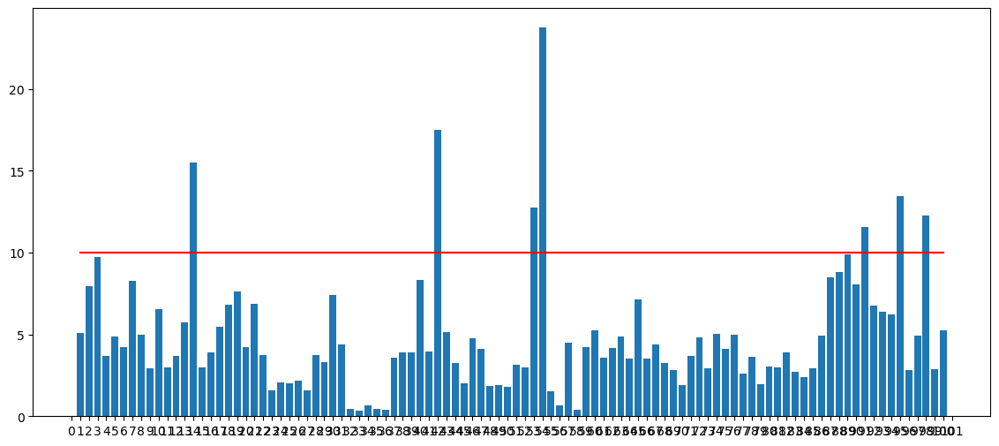

In [36]:
plt.figure(figsize=(14,6))
x_labels = np.arange(0,102)
no_df = pd.DataFrame({'score':smape_list})

plt.bar(np.arange(len(no_df))+1,no_df['score'])
plt.xticks(np.arange(102),x_labels)
plt.plot([1,100], [10, 10], color = 'red')
plt.show()

In [37]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,8,9,0.9,0.9,10,528
1,100,0.01,11,6,0.9,0.9,7,335
2,100,0.01,9,3,0.9,0.9,7,203
3,100,0.01,1,4,0.9,0.9,3,303
4,100,0.01,11,7,0.9,0.9,100,570


In [38]:
merged_test_df.head()


,building_number,temperature,rainfall,windspeed,humidity,hour,day,month,week,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,max_power,min_power
0,1,23.5,0.0,2.2,72,0,3,8,34,1627.80,1706.318118,446.882767,-2.5,0,0.000000,1.000000,58.3456,4250.12,1325.32
1,1,23.0,0.0,0.9,72,1,3,8,34,1550.08,1622.620235,439.662704,-5.5,0,0.258819,0.965926,57.4456,4250.12,1325.32
2,1,22.7,0.0,1.5,75,2,3,8,34,1431.12,1506.971294,412.071906,-8.8,0,0.500000,0.866025,57.8725,4250.12,1325.32
3,1,22.1,0.0,1.3,78,3,3,8,34,1372.20,1437.365647,391.205981,-12.7,0,0.707107,0.707107,57.9376,4250.12,1325.32
4,1,21.8,0.0,1.0,77,4,3,8,34,1381.72,1447.321412,381.099697,-16.9,0,0.866025,0.500000,56.9961,4250.12,1325.32


In [39]:
merged_train_df.head()

,building_number,temperature,rainfall,windspeed,humidity,power_consumption,hour,day,month,week,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,max_power,min_power
0,1,18.6,0.0,0.9,42.0,1085.28,0,2,6,22,1774.744615,1706.318118,446.882767,-7.4,1,0.000000,1.000000,49.6576,4210.375385,1291.901538
1,1,18.0,0.0,1.1,45.0,1047.36,1,2,6,22,1687.347692,1622.620235,439.662704,-15.4,1,0.258819,0.965926,47.7625,4210.375385,1291.901538
2,1,17.7,0.0,1.5,45.0,974.88,2,2,6,22,1571.483077,1506.971294,412.071906,-23.7,1,0.500000,0.866025,47.2225,4210.375385,1291.901538
3,1,16.7,0.0,1.4,48.0,953.76,3,2,6,22,1522.153846,1437.365647,391.205981,-33.0,1,0.707107,0.707107,44.7856,4210.375385,1291.901538
4,1,18.4,0.0,2.8,43.0,986.40,4,2,6,22,1506.793846,1447.321412,381.099697,-40.6,1,0.866025,0.500000,49.0061,4210.375385,1291.901538


In [14]:
xgb_params.to_csv('./parameters/hyperparameter_xgb_holly2_lbw.csv', index=False)

NameError: name 'xgb_params' is not defined

In [5]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_holly2_lbw.csv')
#best_it = xgb_params['best_it'].to_list()
#best_it[0]        # 1051
xgb_params.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   n_estimators      100 non-null    int64  
 1   eta               100 non-null    float64
 2   min_child_weight  100 non-null    int64  
 3   max_depth         100 non-null    int64  
 4   colsample_bytree  100 non-null    float64
 5   subsample         100 non-null    float64
 6   alpha             100 non-null    int64  
 7   best_it           100 non-null    int64  
dtypes: float64(3), int64(5)
memory usage: 6.4 KB


## 학습

In [8]:
preds = np.array([])
scores=[]
missfit_building=[]
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
        x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
        y_test = merged_valid_df.loc[merged_valid_df.building_number == i, 'power_consumption']
        x_test = merged_valid_df.loc[merged_valid_df.building_number == i].drop(['power_consumption'], axis=1)

        xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    pred_np = pred.to_numpy()
    y_test_np = y_test.to_numpy()
    score = SMAPE(y_test_np, pred_np)
    
    scores.append(score)
    preds = np.append(preds, pred)

    if score > 6:
        missfit_building.append(i)

100%|██████████| 100/100 [07:25<00:00,  4.45s/it]


In [17]:
np.mean(scores)
miss_score=[]
for i in missfit_building:
    miss_score.append(scores[i-1])

miss_data = pd.DataFrame({'building_number': missfit_building, 'SMAPE': miss_score})


In [18]:
miss_data.to_csv('./miss_data_lbw.csv', index=False)

In [19]:
all_scores = pd.DataFrame({'building_score': scores})
all_scores.to_csv('./all_scores_lbw.csv', index=False)

In [6]:
preds = np.array([])
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
        x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
        x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
        x_test = x_test[x_train.columns]

        xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    

100%|██████████| 100/100 [08:19<00:00,  5.00s/it]


In [13]:
# preds = np.array([])
# for i in tqdm(np.arange(1,101,1)):

#     pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

#     for seed in [0,1,2,3,4,5]: # 각 시드별 예측
#         y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#         x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
#         x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
#         x_test = x_test[x_train.columns]
#         xgb_params.iloc[94,7]=550
#         xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
#                         min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
#                         colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])
    

#         if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
#             xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

#         xgb.fit(x_train, y_train)
#         y_pred = xgb.predict(x_test)
#         pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

#     pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
#     preds = np.append(preds, pred)
    

100%|██████████| 100/100 [10:27<00:00,  6.28s/it]


## 테스트

In [7]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = merged_train_df.loc[merged_train_df.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040), train_y)
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
plt.savefig('./predict_xgb_holly3_lbw.png')


## 제출

In [8]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./submission/submission_xgb_holly2_lbw.csv', index = False)


## 1등코드 원본


In [ ]:
# from sklearn.model_selection import PredefinedSplit, GridSearchCV
# from sklearn.metrics import make_scorer
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
# preds = np.array([])

# grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
#         'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
#         'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

# for i in tqdm(np.arange(1, 101, 1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i, ].drop('power_consumption', axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

#     smape_score = make_scorer(SMAPE, graeter_is_better=False)
#     pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
#     gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#                                                  tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#                          param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)
#     # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#     #                                             tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#     #                    param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)


#     gcv.fit(x_train, y_train)
#     best = gcv.best_estimator_
#     params = gcv.best_params_
#     print(params)
#     pred = best.predict(x_test)
#     building = 'building'+str(i)
#     print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
#     preds = np.append(preds, pred)
#     df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
#     df.to_csv('./hyperparameter_xgb.csv', index = False) # save the tuned parameters

## 